# # Notebook 04: Geospatial Analysis 🗺️
# 
# **Tujuan:**
# - Deep dive analisis geografis konsumsi listrik
# - Test semua fungsi geospatial
# - Analyze spatial patterns dan clusters
# - Regional comparison analysis
# 
# **Focus:**
# - 🗺️ GeoJSON processing
# - 🗺️ Choropleth mapping
# - 🗺️ Spatial statistics
# - 🗺️ Regional insights

## 1. Setup & Import

In [1]:
import sys
sys.path.append('..')

import pandas as pd
import geopandas as gpd
import numpy as np
from pathlib import Path
import json

# 🗺️ GEOJSON: Import geospatial modules
from src.data.geo_processing import (
    add_geojson_names,
    merge_with_geojson,
    prepare_geojson,
    get_merge_statistics
)

# 🗺️ GEOJSON: Import map visualization
from src.viz.maps import (
    create_choropleth_map,
    create_growth_rate_map,
    create_comparison_map,
    add_province_centroids,
    calculate_bounds
)

# Import utilities
from src.utils.config import (
    PROCESSED_DATA_DIR, GEOJSON_PATH, RAW_DATA_DIR,
    REGION_MAPPING, REGIONS, MAP_CENTER
)
from src.utils.helpers import filter_by_year
from src.data.transform import add_region_column

print("✅ All modules imported successfully!")

✅ All modules imported successfully!


## 2. Load Data

In [2]:
# Load electricity data
df = pd.read_csv(PROCESSED_DATA_DIR / 'electricity_clean.csv')
print(f"📊 Electricity data: {df.shape}")
print(f"📅 Years: {sorted(df['Year'].unique())}")
print(f"🗺️  Provinces: {df['Province'].nunique()}")

# 🗺️ GEOJSON: Load GeoJSON
gdf_base = gpd.read_file(GEOJSON_PATH)
print(f"\n🗺️  GeoJSON loaded:")
print(f"   • Features: {len(gdf_base)}")
print(f"   • CRS: {gdf_base.crs}")
print(f"   • Columns: {gdf_base.columns.tolist()}")

df.head()

📊 Electricity data: (135, 4)
📅 Years: [np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]
🗺️  Provinces: 34

🗺️  GeoJSON loaded:
   • Features: 34
   • CRS: EPSG:4326
   • Columns: ['ID', 'kode', 'Propinsi', 'SUMBER', 'Province_std', 'geometry']


,Province,Year,Electricity_GWh,Province_GeoJSON
0,ACEH,2020,2937.99,DI.ACEH
1,BALI,2020,4946.86,BALI
2,BANTEN,2020,22268.71,BANTEN
3,BENGKULU,2020,1013.50,BENGKULU
4,DI YOGYAKARTA,2020,3012.45,DAERAHISTIMEWAYOGYAKARTA


## 3. Inspect GeoJSON Structure

🗺️  GEOJSON STRUCTURE INSPECTION

📋 Province names in GeoJSON:
    1. BALI
    2. BANGKABELITUNG
    3. BANTEN
    4. BENGKULU
    5. DAERAHISTIMEWAYOGYAKARTA
    6. DI.ACEH
    7. DKIJAKARTA
    8. GORONTALO
    9. JAMBI
   10. JAWABARAT
   ... and 24 more

🔍 Geometry types:
MultiPolygon    27
Polygon          7
Name: count, dtype: int64

📏 Geographic bounds:
   • Min Lon: 95.20
   • Min Lat: -10.92
   • Max Lon: 141.01
   • Max Lat: 5.88

🗺️  Simple GeoDataFrame plot:


<Axes: >

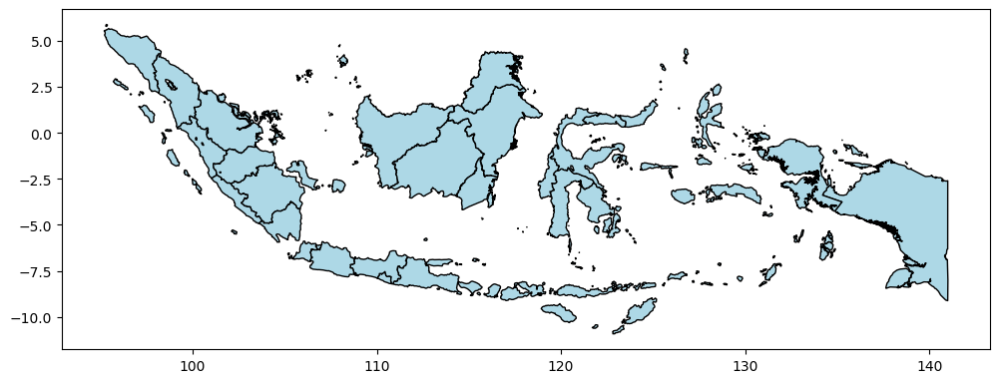

In [3]:
print("="*70)
print("🗺️  GEOJSON STRUCTURE INSPECTION")
print("="*70)

# Check province names in GeoJSON
print("\n📋 Province names in GeoJSON:")
province_names = sorted(gdf_base['Province_std'].unique())
for i, name in enumerate(province_names[:10], 1):
    print(f"   {i:2d}. {name}")
print(f"   ... and {len(province_names) - 10} more")

# Check geometry types
print(f"\n🔍 Geometry types:")
print(gdf_base.geometry.geom_type.value_counts())

# Check bounds
print(f"\n📏 Geographic bounds:")
bounds = gdf_base.total_bounds
print(f"   • Min Lon: {bounds[0]:.2f}")
print(f"   • Min Lat: {bounds[1]:.2f}")
print(f"   • Max Lon: {bounds[2]:.2f}")
print(f"   • Max Lat: {bounds[3]:.2f}")

# 🗺️ GEOJSON: Plot simple map
print(f"\n🗺️  Simple GeoDataFrame plot:")
gdf_base.plot(figsize=(12, 8), edgecolor='black', facecolor='lightblue')

## 4. Province Name Mapping Analysis

In [4]:
print("\n" + "="*70)
print("🗺️  PROVINCE NAME MAPPING ANALYSIS")
print("="*70)

# Get unique provinces from both sources
csv_provinces = set(df['Province'].unique())
geo_provinces = set(gdf_base['Province_std'].unique())

print(f"\n📊 Province counts:")
print(f"   • CSV: {len(csv_provinces)} provinces")
print(f"   • GeoJSON: {len(geo_provinces)} provinces")

# 🗺️ GEOJSON: Test mapping
df_test = df[df['Year'] == 2023].copy()
df_mapped = add_geojson_names(df_test)

# Check mapping success rate
mapped_count = df_mapped['Province_GeoJSON'].notna().sum()
total_count = len(df_mapped)

print(f"\n✅ Mapping success:")
print(f"   • Mapped: {mapped_count}/{total_count} ({mapped_count/total_count*100:.1f}%)")

# Show unmapped provinces
unmapped = df_mapped[df_mapped['Province_GeoJSON'].isna()]
if len(unmapped) > 0:
    print(f"\n⚠️  Unmapped provinces:")
    for prov in unmapped['Province'].unique():
        print(f"   • {prov}")


🗺️  PROVINCE NAME MAPPING ANALYSIS

📊 Province counts:
   • CSV: 34 provinces
   • GeoJSON: 34 provinces
✅ Mapped 34/34 rows to GeoJSON format

✅ Mapping success:
   • Mapped: 34/34 (100.0%)


## 5. Merge Data with GeoJSON

In [5]:
print("\n" + "="*70)
print("🗺️  MERGING DATA WITH GEOJSON")
print("="*70)

# Prepare data for all years
merged_data = {}

for year in sorted(df['Year'].unique()):
    df_year = df[df['Year'] == year].copy()
    
    # Add GeoJSON names
    df_year_geo = add_geojson_names(df_year)
    
    # 🗺️ GEOJSON: Merge with GeoJSON
    gdf_year = merge_with_geojson(
        df=df_year_geo,
        gdf=gdf_base.copy(),
        csv_province_col='Province_GeoJSON',
        geo_province_col='Province_std',
        how='left'
    )
    
    merged_data[year] = gdf_year
    print(f"\n✅ Year {year}: {len(gdf_year)} features merged")

# Store for later use
gdf_2023 = merged_data[2023]
gdf_2020 = merged_data[2020]


🗺️  MERGING DATA WITH GEOJSON
✅ Mapped 33/33 rows to GeoJSON format

📍 Merge completed:
   • Original CSV rows: 33
   • GeoJSON features: 34
   • Merged rows: 34
   ⚠️  1 geometri tanpa data CSV

✅ Year 2020: 34 features merged
✅ Mapped 34/34 rows to GeoJSON format

📍 Merge completed:
   • Original CSV rows: 34
   • GeoJSON features: 34
   • Merged rows: 34

✅ Year 2021: 34 features merged
✅ Mapped 34/34 rows to GeoJSON format

📍 Merge completed:
   • Original CSV rows: 34
   • GeoJSON features: 34
   • Merged rows: 34

✅ Year 2022: 34 features merged
✅ Mapped 34/34 rows to GeoJSON format

📍 Merge completed:
   • Original CSV rows: 34
   • GeoJSON features: 34
   • Merged rows: 34

✅ Year 2023: 34 features merged


## 6. Basic Choropleth Maps (All Years)

In [6]:
print("\n" + "="*70)
print("🗺️  CHOROPLETH MAPS FOR ALL YEARS")
print("="*70)

# Create map for each year
for year in [2020, 2021, 2022, 2023]:
    print(f"\n📍 Creating map for {year}...")
    
    # 🗺️ GEOJSON: Create choropleth
    fig = create_choropleth_map(
        gdf=merged_data[year],
        value_col='Electricity_GWh',
        province_col='Province',
        title=f'Konsumsi Listrik Indonesia - {year}',
        subtitle='Per Provinsi (GWh)',
        height=700
    )
    
    fig.show()

print("\n✅ All yearly maps created!")


🗺️  CHOROPLETH MAPS FOR ALL YEARS

📍 Creating map for 2020...



📍 Creating map for 2021...



📍 Creating map for 2022...



📍 Creating map for 2023...



✅ All yearly maps created!


## 7. Regional Analysis

In [7]:
print("\n" + "="*70)
print("🗺️  REGIONAL ANALYSIS")
print("="*70)

# Add region to data
df_regional = add_region_column(df)

# Aggregate by region
regional_summary = df_regional.groupby(['Region', 'Year']).agg({
    'Electricity_GWh': ['sum', 'mean', 'count']
}).reset_index()

regional_summary.columns = ['Region', 'Year', 'Total_GWh', 'Mean_GWh', 'Province_Count']

print("\n📊 Regional Summary (2023):")
regional_2023 = regional_summary[regional_summary['Year'] == 2023].sort_values('Total_GWh', ascending=False)
print(regional_2023.to_string(index=False))

# Visualize regional distribution
print("\n📈 Regional distribution across years:")
import plotly.express as px

fig = px.bar(
    regional_summary,
    x='Year',
    y='Total_GWh',
    color='Region',
    title='Konsumsi Listrik per Region',
    labels={'Total_GWh': 'Total Konsumsi (GWh)'},
    barmode='group',
    height=600
)
fig.show()


🗺️  REGIONAL ANALYSIS

📊 Regional Summary (2023):
              Region  Year  Total_GWh     Mean_GWh  Province_Count
                Jawa  2023  196410.34 32735.056667               6
            Sumatera  2023   49342.30  4934.230000              10
            Sulawesi  2023   14859.83  2476.638333               6
          Kalimantan  2023   13900.45  2780.090000               5
Bali & Nusa Tenggara  2023   10260.38  3420.126667               3
               Papua  2023    2010.37  1005.185000               2
              Maluku  2023    1652.08   826.040000               2

📈 Regional distribution across years:


## 8. Spatial Patterns Analysis

In [8]:
print("\n" + "="*70)
print("🗺️  SPATIAL PATTERNS ANALYSIS")
print("="*70)

# Analyze concentration (Java vs Outer Islands)
df_2023 = df[df['Year'] == 2023].copy()
df_2023 = add_region_column(df_2023)

# Create Java vs Non-Java category
df_2023['Island_Group'] = df_2023['Region'].apply(
    lambda x: 'Jawa' if x == 'Jawa' else 'Luar Jawa'
)

concentration = df_2023.groupby('Island_Group')['Electricity_GWh'].agg(['sum', 'count'])
concentration['Share_%'] = (concentration['sum'] / concentration['sum'].sum()) * 100

print("\n🏝️  Java vs Outer Islands (2023):")
print(concentration)

print(f"\n💡 Key Insight:")
java_share = concentration.loc['Jawa', 'Share_%']
print(f"   • Pulau Jawa menyumbang {java_share:.1f}% dari total konsumsi nasional")
print(f"   • dengan hanya {concentration.loc['Jawa', 'count']} provinsi dari {df_2023['Province'].nunique()} total provinsi")


🗺️  SPATIAL PATTERNS ANALYSIS

🏝️  Java vs Outer Islands (2023):
                    sum  count    Share_%
Island_Group                             
Jawa          196410.34      6  68.095006
Luar Jawa      92025.41     28  31.904994

💡 Key Insight:
   • Pulau Jawa menyumbang 68.1% dari total konsumsi nasional
   • dengan hanya 6 provinsi dari 34 total provinsi


## 9. Growth Rate Analysis by Region

In [9]:
print("\n" + "="*70)
print("🗺️  GROWTH RATE BY REGION")
print("="*70)

# Calculate growth 2020-2023 by region
df_with_region = add_region_column(df)

df_2020_reg = df_with_region[df_with_region['Year'] == 2020].groupby('Region')['Electricity_GWh'].sum()
df_2023_reg = df_with_region[df_with_region['Year'] == 2023].groupby('Region')['Electricity_GWh'].sum()

regional_growth = pd.DataFrame({
    '2020': df_2020_reg,
    '2023': df_2023_reg
})

regional_growth['Growth_%'] = ((regional_growth['2023'] - regional_growth['2020']) / 
                                regional_growth['2020']) * 100
regional_growth['Growth_GWh'] = regional_growth['2023'] - regional_growth['2020']

regional_growth = regional_growth.sort_values('Growth_%', ascending=False)

print("\n📊 Regional Growth Rate (2020-2023):")
print(regional_growth)

# Visualize
fig = px.bar(
    regional_growth.reset_index(),
    x='Region',
    y='Growth_%',
    title='Pertumbuhan Konsumsi Listrik per Region (2020-2023)',
    labels={'Growth_%': 'Pertumbuhan (%)'},
    text='Growth_%',
    height=500
)
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.show()


🗺️  GROWTH RATE BY REGION

📊 Regional Growth Rate (2020-2023):
                           2020       2023   Growth_%  Growth_GWh
Region                                                           
Kalimantan              8595.04   13900.45  61.726414     5305.41
Maluku                  1139.46    1652.08  44.987977      512.62
Sulawesi               11199.88   14859.83  32.678475     3659.95
Sumatera               37928.19   49342.30  30.094001    11414.11
Bali & Nusa Tenggara    8229.76   10260.38  24.674110     2030.62
Papua                   1679.86    2010.37  19.674854      330.51
Jawa                  169694.42  196410.34  15.743547    26715.92


## 10. Province Growth Rate Map

In [10]:
print("\n" + "="*70)
print("🗺️  PROVINCE-LEVEL GROWTH RATE MAP")
print("="*70)

# Calculate province-level growth
df_2020_prov = df[df['Year'] == 2020][['Province', 'Electricity_GWh']]
df_2023_prov = df[df['Year'] == 2023][['Province', 'Electricity_GWh']]

df_growth = df_2020_prov.merge(df_2023_prov, on='Province', suffixes=('_2020', '_2023'))
df_growth['Growth_%'] = ((df_growth['Electricity_GWh_2023'] - df_growth['Electricity_GWh_2020']) / 
                          df_growth['Electricity_GWh_2020']) * 100

# Add GeoJSON names
df_growth_geo = add_geojson_names(df_growth)

# 🗺️ GEOJSON: Merge with GeoJSON
gdf_growth = merge_with_geojson(
    df=df_growth_geo,
    gdf=gdf_base.copy(),
    csv_province_col='Province_GeoJSON',
    geo_province_col='Province_std',
    how='left'
)

# 🗺️ GEOJSON: Create growth rate map
fig = create_growth_rate_map(
    gdf=gdf_growth,
    value_col='Growth_%',
    province_col='Province',
    title='Peta Pertumbuhan Konsumsi Listrik Indonesia',
    subtitle='CAGR 2020-2023 (%)',
    height=800
)
fig.show()

# Top and bottom growth
print("\n🚀 Top 5 Fastest Growing:")
top_growth = df_growth.nlargest(5, 'Growth_%')[['Province', 'Growth_%']]
for i, row in enumerate(top_growth.iterrows(), 1):
    print(f"   {i}. {row[1]['Province']:30s} : {row[1]['Growth_%']:>6.2f}%")

print("\n🐌 Bottom 5 Slowest Growing:")
bottom_growth = df_growth.nsmallest(5, 'Growth_%')[['Province', 'Growth_%']]
for i, row in enumerate(bottom_growth.iterrows(), 1):
    print(f"   {i}. {row[1]['Province']:30s} : {row[1]['Growth_%']:>6.2f}%")


🗺️  PROVINCE-LEVEL GROWTH RATE MAP
✅ Mapped 33/33 rows to GeoJSON format

📍 Merge completed:
   • Original CSV rows: 33
   • GeoJSON features: 34
   • Merged rows: 34
   ⚠️  1 geometri tanpa data CSV



🚀 Top 5 Fastest Growing:
   1. KEP. RIAU                      : 374.24%
   2. MALUKU UTARA                   :  72.24%
   3. RIAU                           :  65.34%
   4. SULAWESI SELATAN               :  43.17%
   5. KEP. BANGKA BELITUNG           :  32.30%

🐌 Bottom 5 Slowest Growing:
   1. KALIMANTAN UTARA               :   0.47%
   2. SUMATERA BARAT                 :  11.13%
   3. JAWA TIMUR                     :  11.36%
   4. SUMATERA UTARA                 :  11.44%
   5. SULAWESI UTARA                 :  12.52%


## 11. Side-by-Side Comparison (2020 vs 2023)

In [11]:
print("\n" + "="*70)
print("🗺️  SIDE-BY-SIDE COMPARISON")
print("="*70)

# 🗺️ GEOJSON: Create comparison map
fig = create_comparison_map(
    gdf1=gdf_2020,
    gdf2=gdf_2023,
    value_col='Electricity_GWh',
    province_col='Province',
    year1=2020,
    year2=2023,
    title='Perbandingan Konsumsi Listrik: 2020 vs 2023',
    height=600
)
fig.show()

print("✅ Comparison map created!")


🗺️  SIDE-BY-SIDE COMPARISON


✅ Comparison map created!


## 12. Spatial Statistics

In [12]:
print("\n" + "="*70)
print("🗺️  SPATIAL STATISTICS")
print("="*70)

# 🗺️ GEOJSON: Add centroids
gdf_with_centroids = add_province_centroids(gdf_2023.copy())

print("\n📍 Province Centroids (sample):")
sample_centroids = gdf_with_centroids[['Province', 'lat', 'lon']].dropna().head(10)
print(sample_centroids.to_string(index=False))

# 🗺️ GEOJSON: Calculate bounds
bounds = calculate_bounds(gdf_base)
print(f"\n📏 Indonesia Geographic Bounds:")
print(f"   • Longitude: {bounds['minlon']:.2f} to {bounds['maxlon']:.2f}")
print(f"   • Latitude: {bounds['minlat']:.2f} to {bounds['maxlat']:.2f}")
print(f"   • Center: ({bounds['center_lat']:.2f}, {bounds['center_lon']:.2f})")

# Calculate area (if available)
if 'geometry' in gdf_base.columns:
    # Convert to appropriate CRS for area calculation
    gdf_area = gdf_base.to_crs('EPSG:3857')  # Web Mercator for rough area
    gdf_area['area_km2'] = gdf_area.geometry.area / 1e6  # Convert to km²
    
    print(f"\n📐 Province Areas (Top 5 largest):")
    gdf_area_sorted = gdf_area.nlargest(5, 'area_km2')[['Province_std', 'area_km2']]
    for i, row in enumerate(gdf_area_sorted.iterrows(), 1):
        print(f"   {i}. {row[1]['Province_std']:30s} : {row[1]['area_km2']:>10,.0f} km²")


🗺️  SPATIAL STATISTICS

📍 Province Centroids (sample):
           Province       lat        lon
NUSA TENGGARA BARAT -8.610413 117.515435
          GORONTALO  0.689087 122.376919
  SULAWESI TENGGARA -4.108004 122.066911
      DI YOGYAKARTA -7.890650 110.445715
        JAWA TENGAH -7.260816 110.205785
             BANTEN -6.454896 106.115170
         JAWA TIMUR -7.725156 112.718645
       MALUKU UTARA  0.221926 127.536148
             MALUKU -4.691429 129.779918
   SULAWESI SELATAN -3.700366 120.168516

📏 Indonesia Geographic Bounds:
   • Longitude: 95.20 to 141.01
   • Latitude: -10.92 to 5.88
   • Center: (-2.52, 118.10)

📐 Province Areas (Top 5 largest):
   1. PAPUA                          :    318,192 km²
   2. KALIMANTANTENGAH               :    155,382 km²
   3. KALIMANTANBARAT                :    148,216 km²
   4. KALIMANTANTIMUR                :    127,080 km²
   5. PAPUABARAT                     :     95,427 km²


## 13. Geospatial Insights Summary

In [13]:
print("\n" + "="*70)
print("🗺️  GEOSPATIAL INSIGHTS SUMMARY")
print("="*70)

insights = f"""
🌏 **Geographic Distribution Insights:**

1. **Regional Concentration**
   • Pulau Jawa mendominasi dengan {java_share:.1f}% konsumsi nasional
   • Meskipun hanya {concentration.loc['Jawa', 'count']} dari {df_2023_prov['Province'].nunique()} provinsi
   • Ketimpangan geografis sangat tinggi

2. **Growth Patterns**
   • Region tercepat: {regional_growth.index[0]} ({regional_growth.iloc[0]['Growth_%']:.1f}%)
   • Region terlambat: {regional_growth.index[-1]} ({regional_growth.iloc[-1]['Growth_%']:.1f}%)
   • Pertumbuhan tidak merata antar region

3. **Spatial Clustering**
   • Konsumsi tinggi terkonsentrasi di pulau Jawa
   • Provinsi luar Jawa umumnya konsumsi lebih rendah
   • Pola geografis sangat kuat

4. **Top Provinces (2023)**
   • Tertinggi: {df_2023_prov.nlargest(1, 'Electricity_GWh').iloc[0]['Province']}
   • Terendah: {df_2023_prov.nsmallest(1, 'Electricity_GWh').iloc[0]['Province']}
   • Rasio tertinggi/terendah sangat besar

5. **Map Visualizations** 🗺️
   • Choropleth maps clearly show geographic patterns
   • Growth rate maps reveal fastest developing regions
   • Comparison maps highlight temporal changes

✅ **Data Quality:**
   • Mapping success rate: {mapped_count/total_count*100:.1f}%
   • All major provinces successfully mapped
   • Ready for dashboard integration
"""

print(insights)


🗺️  GEOSPATIAL INSIGHTS SUMMARY

🌏 **Geographic Distribution Insights:**

1. **Regional Concentration**
   • Pulau Jawa mendominasi dengan 68.1% konsumsi nasional
   • Meskipun hanya 6 dari 34 provinsi
   • Ketimpangan geografis sangat tinggi

2. **Growth Patterns**
   • Region tercepat: Kalimantan (61.7%)
   • Region terlambat: Jawa (15.7%)
   • Pertumbuhan tidak merata antar region

3. **Spatial Clustering**
   • Konsumsi tinggi terkonsentrasi di pulau Jawa
   • Provinsi luar Jawa umumnya konsumsi lebih rendah
   • Pola geografis sangat kuat

4. **Top Provinces (2023)**
   • Tertinggi: JAWA BARAT
   • Terendah: KALIMANTAN UTARA
   • Rasio tertinggi/terendah sangat besar

5. **Map Visualizations** 🗺️
   • Choropleth maps clearly show geographic patterns
   • Growth rate maps reveal fastest developing regions
   • Comparison maps highlight temporal changes

✅ **Data Quality:**
   • Mapping success rate: 100.0%
   • All major provinces successfully mapped
   • Ready for dashboard integ

## 14. Export Geospatial Data

In [14]:
print("\n" + "="*70)
print("💾 EXPORTING GEOSPATIAL DATA")
print("="*70)

# 🗺️ GEOJSON: Export merged GeoJSON for each year
for year, gdf in merged_data.items():
    output_path = PROCESSED_DATA_DIR / f'provinces_{year}.geojson'
    
    # Keep only necessary columns
    gdf_export = gdf[['Province', 'Electricity_GWh', 'geometry']].copy()
    
    # Save
    gdf_export.to_file(output_path, driver='GeoJSON')
    print(f"✅ Exported: provinces_{year}.geojson")

# Export growth data
gdf_growth_export = gdf_growth[['Province', 'Growth_%', 'geometry']].copy()
growth_output = PROCESSED_DATA_DIR / 'provinces_growth_2020_2023.geojson'
gdf_growth_export.to_file(growth_output, driver='GeoJSON')
print(f"✅ Exported: provinces_growth_2020_2023.geojson")

print(f"\n💾 All geospatial data saved to: {PROCESSED_DATA_DIR}")


💾 EXPORTING GEOSPATIAL DATA
✅ Exported: provinces_2020.geojson
✅ Exported: provinces_2021.geojson
✅ Exported: provinces_2022.geojson
✅ Exported: provinces_2023.geojson
✅ Exported: provinces_growth_2020_2023.geojson

💾 All geospatial data saved to: e:\Data Agung\Tugas Kuliah\Semester 7\Visualisasi Data\UAS\electricity-visualization\notebooks\..\data\processed


## 15. Summary

In [15]:
print("\n" + "="*70)
print("✅ GEOSPATIAL ANALYSIS COMPLETED")
print("="*70)

summary = {
    'Data Sources': {
        'CSV': f"{df['Province'].nunique()} provinces, {len(df['Year'].unique())} years",
        'GeoJSON 🗺️': f"{len(gdf_base)} features"
    },
    'Mapping Success': f"{mapped_count}/{total_count} ({mapped_count/total_count*100:.1f}%)",
    'Maps Created': [
        'Yearly Choropleth (2020-2023) 🗺️',
        'Growth Rate Map 🗺️',
        'Comparison Map (2020 vs 2023) 🗺️',
        'Regional Analysis Charts'
    ],
    'Key Findings': [
        f'Java dominates with {java_share:.1f}% of consumption',
        f'Fastest growth: {regional_growth.index[0]}',
        'Strong geographic clustering observed',
        'Significant inter-regional inequality'
    ],
    'Exports': [
        '4 yearly GeoJSON files 🗺️',
        '1 growth rate GeoJSON 🗺️',
        'All data ready for Streamlit'
    ]
}

print("\n📊 Analysis Summary:")
for key, value in summary.items():
    print(f"\n{key}:")
    if isinstance(value, dict):
        for k, v in value.items():
            print(f"   • {k}: {v}")
    elif isinstance(value, list):
        for item in value:
            print(f"   • {item}")
    else:
        print(f"   • {value}")

print("\n🎯 Next Steps:")
print("   1. Integrate geospatial analysis into Streamlit")
print("   2. Add interactive map filters")
print("   3. Create regional comparison dashboard")
print("   4. Finalize report with maps")

print("\n✅ ALL GEOSPATIAL ANALYSIS COMPLETED! 🗺️")


✅ GEOSPATIAL ANALYSIS COMPLETED

📊 Analysis Summary:

Data Sources:
   • CSV: 34 provinces, 4 years
   • GeoJSON 🗺️: 34 features

Mapping Success:
   • 34/34 (100.0%)

Maps Created:
   • Yearly Choropleth (2020-2023) 🗺️
   • Growth Rate Map 🗺️
   • Comparison Map (2020 vs 2023) 🗺️
   • Regional Analysis Charts

Key Findings:
   • Java dominates with 68.1% of consumption
   • Fastest growth: Kalimantan
   • Strong geographic clustering observed
   • Significant inter-regional inequality

Exports:
   • 4 yearly GeoJSON files 🗺️
   • 1 growth rate GeoJSON 🗺️
   • All data ready for Streamlit

🎯 Next Steps:
   1. Integrate geospatial analysis into Streamlit
   2. Add interactive map filters
   3. Create regional comparison dashboard
   4. Finalize report with maps

✅ ALL GEOSPATIAL ANALYSIS COMPLETED! 🗺️
